In [1]:
import numpy as np
import scipy
import h5py
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from simulation_data import get
from simulation_data.galaxies import GalaxyPopulation
my_galaxy_population = GalaxyPopulation()
from simulation_data.galaxies.galaxy import age_profile, get_star_formation_history, get_galaxy_particle_data, get_stellar_assembly_data, metallicity_profile, metals_profile, avg_abundance, total_stellar_mass

redshift=0

# z=0 galaxies

Load pre-calculated data from file: ```galaxy_population_data_2.hdf5``` for faster execution.

In [2]:
with h5py.File('galaxy_population_data_'+str(redshift)+'.hdf5', 'r') as f:
    ids = f['ids'][:]
    median_age = f['median_age'][:]
    halfmass_radius = f['halfmass_radius'][:]
    total_mass = f['total_mass'][:]
    newbin_current_SFR = f['newbin_current_SFR'][:]
    FeH_Re = f['FeH_Re'][:]
    MgFe_Re = f['MgFe_Re'][:]
    MgH_Re = f['MgH_Re'][:]
    FeH_1kpc = f['FeH_1kpc'][:]
    MgFe_1kpc = f['MgFe_1kpc'][:]
    MgH_1kpc = f['MgH_1kpc'][:]

Now apply the selection criteria for star-forming, young quiescent (post-starburst), intermediate, and old quiescent galaxies at $z=2$.

In [3]:
import warnings
warnings.filterwarnings('ignore')

# z=0.7 parameters
# 2 -> 4 Gyr
# 4 -> 6 Gyr
# -11 -> -11.5
PSB_selection = (median_age<=4)&(np.log10(newbin_current_SFR/10**(total_mass))<=-11.5)
intermediate_quiescent_selection = (median_age>4)&(median_age<=6)&(np.log10(newbin_current_SFR/10**(total_mass))<=-11.5)
old_quiescent_selection = (median_age>6)&(np.log10(newbin_current_SFR/10**(total_mass))<=-11.5)
starforming_selection = (np.log10(newbin_current_SFR/10**(total_mass))>-11.5)

In [4]:
# axes limits
age_lim = [0, 14]
FeH_lim = [-2.0, 1.0]
MgFe_lim = [0, 1]
r_lim = [0, 5]
sfr_lim = [0, 0.12]
timerange=14

# [Fe/H]

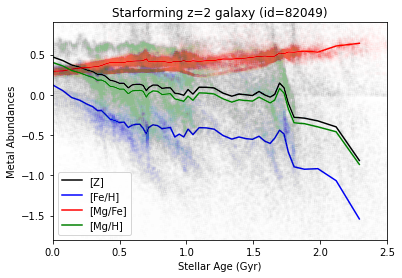

In [11]:
np.random.seed(9)
id = np.random.choice(ids[starforming_selection])
n_bins = 50

plt.figure()

yy1, xx1, age, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, axis='age')
plt.plot(xx1, np.log10(yy1), 'k', label='[Z]')
plt.plot(age, metallicity, 'k.', alpha=0.002)

yy2, logFeH, xx2, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
plt.plot(xx2, yy2, 'b', label='[Fe/H]')
plt.plot(age, logFeH, 'royalblue', marker='.', alpha=0.002)

yy3, logMgFe, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
plt.plot(xx3, yy3, 'r', label='[Mg/Fe]')
plt.plot(age, logMgFe, 'tomato', marker='.', alpha=0.002)

yy4, logMgH, xx4, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', axis='age')
plt.plot(xx4, yy4, 'g', label='[Mg/H]')
plt.plot(age, logMgH, 'darkseagreen', marker='.', alpha=0.002)

plt.xlim(age_lim[0], age_lim[1])
plt.ylim(ageabundance_lim[0], ageabundance_lim[1])
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel('Metal Abundances')
plt.title('Starforming z='+str(redshift)+' galaxy (id='+str(id)+')')
plt.legend()

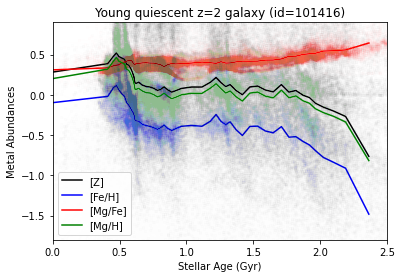

In [10]:
np.random.seed(9)
id = np.random.choice(ids[PSB_selection])
n_bins = 50

plt.figure()

yy1, xx1, age, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, axis='age')
plt.plot(xx1, np.log10(yy1), 'k', label='[Z]')
plt.plot(age, metallicity, 'k.', alpha=0.002)

yy2, logFeH, xx2, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
plt.plot(xx2, yy2, 'b', label='[Fe/H]')
plt.plot(age, logFeH, 'royalblue', marker='.', alpha=0.002)

yy3, logMgFe, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
plt.plot(xx3, yy3, 'r', label='[Mg/Fe]')
plt.plot(age, logMgFe, 'tomato', marker='.', alpha=0.002)

yy4, logMgH, xx4, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', axis='age')
plt.plot(xx4, yy4, 'g', label='[Mg/H]')
plt.plot(age, logMgH, 'darkseagreen', marker='.', alpha=0.002)

plt.xlim(age_lim[0], age_lim[1])
plt.ylim(ageabundance_lim[0], ageabundance_lim[1])
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel('Metal Abundances')
plt.title('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')')
plt.legend()

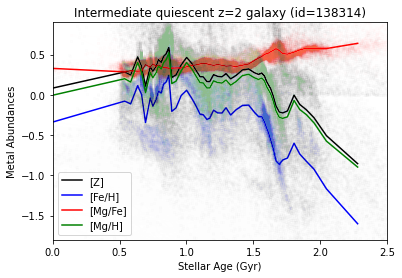

In [12]:
np.random.seed(9)
id = np.random.choice(ids[intermediate_quiescent_selection])
n_bins = 50

plt.figure()

yy1, xx1, age, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, axis='age')
plt.plot(xx1, np.log10(yy1), 'k', label='[Z]')
plt.plot(age, metallicity, 'k.', alpha=0.002)

yy2, logFeH, xx2, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
plt.plot(xx2, yy2, 'b', label='[Fe/H]')
plt.plot(age, logFeH, 'royalblue', marker='.', alpha=0.002)

yy3, logMgFe, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
plt.plot(xx3, yy3, 'r', label='[Mg/Fe]')
plt.plot(age, logMgFe, 'tomato', marker='.', alpha=0.002)

yy4, logMgH, xx4, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', axis='age')
plt.plot(xx4, yy4, 'g', label='[Mg/H]')
plt.plot(age, logMgH, 'darkseagreen', marker='.', alpha=0.002)

plt.xlim(age_lim[0], age_lim[1])
plt.ylim(ageabundance_lim[0], ageabundance_lim[1])
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel('Metal Abundances')
plt.title('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')')
plt.legend()

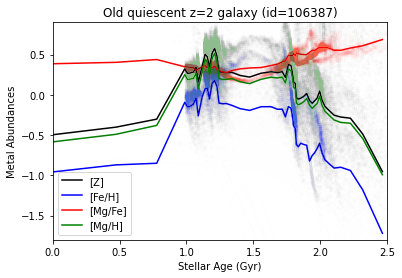

In [5]:
np.random.seed(9)
id = np.random.choice(ids[old_quiescent_selection])
n_bins = 50

plt.figure()


yy1, xx1, age, metallicity, R = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, axis='age')
plt.plot(xx1, np.log10(yy1), 'k', label='[Z]')
plt.plot(age[R<1], metallicity[R<1], 'k.', alpha=0.002)

yy2, logFeH, xx2, age, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
plt.plot(xx2, yy2, 'b', label='[Fe/H]')
plt.plot(age[R<1], logFeH[R<1], 'royalblue', marker='.', alpha=0.002)

yy3, logMgFe, xx3, age, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
plt.plot(xx3, yy3, 'r', label='[Mg/Fe]')
plt.plot(age[R<1], logMgFe[R<1], 'tomato', marker='.', alpha=0.002)

yy4, logMgH, xx4, age, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', axis='age')
plt.plot(xx4, yy4, 'g', label='[Mg/H]')
plt.plot(age[R<1], logMgH[R<1], 'darkseagreen', marker='.', alpha=0.002)

plt.xlim(age_lim[0], age_lim[1])
plt.ylim(ageabundance_lim[0], ageabundance_lim[1])
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel('Metal Abundances')
plt.title('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')')
plt.legend()

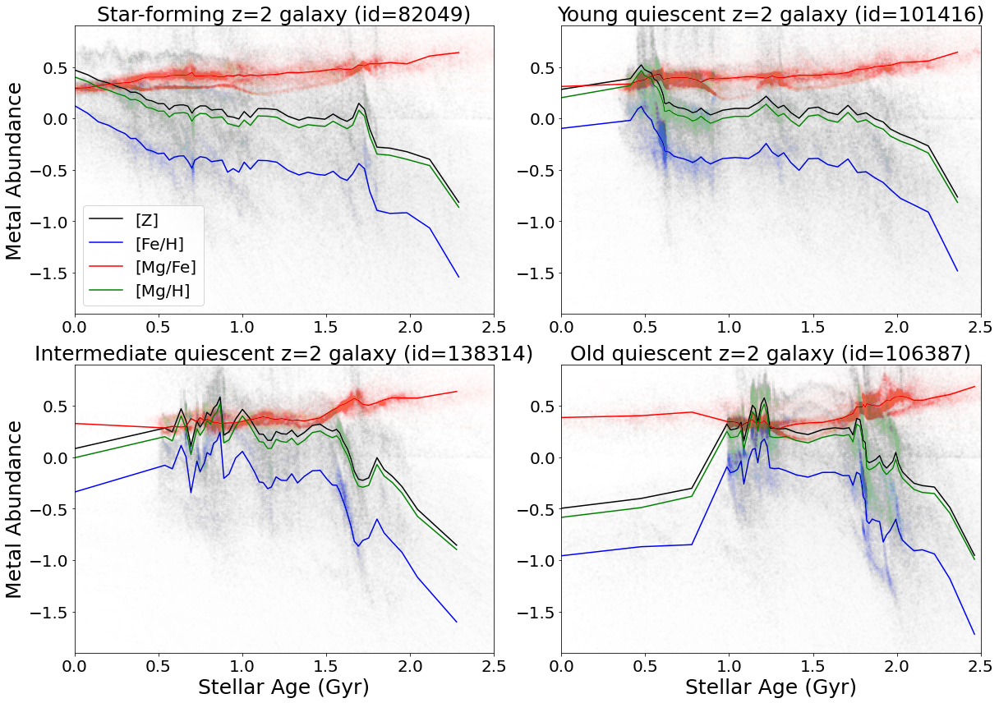

In [16]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 25
fts_s = 20

np.random.seed(9)
idss = [np.random.choice(ids[starforming_selection]), np.random.choice(ids[PSB_selection]), 
       np.random.choice(ids[intermediate_quiescent_selection]), 106387]
n_bins = 50

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
#xx = [total_mass, np.log10(halfmass_radius), np.log10(10**total_mass / halfmass_radius)]
#yy = [FeH_Re, MgFe_Re, MgH_Re]
xlim = [M_lim, logRe_lim, MRe_lim]
ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = 'Stellar Age (Gyr)'
ylabel = 'Metal Abundance'
title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
         'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    yy1, xx1, age, metallicity = metallicity_profile(id=idss[m], redshift=redshift, n_bins=n_bins, axis='age')
    plt.plot(xx1, np.log10(yy1), 'k', label='[Z]')
    plt.plot(age, metallicity, 'k.', alpha=0.002)

    yy2, logFeH, xx2, age = metals_profile(id=idss[m], redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
    plt.plot(xx2, yy2, 'b', label='[Fe/H]')
    plt.plot(age, logFeH, 'royalblue', marker='.', alpha=0.002)

    yy3, logMgFe, xx3, age = metals_profile(id=idss[m], redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
    plt.plot(xx3, yy3, 'r', label='[Mg/Fe]')
    plt.plot(age, logMgFe, 'tomato', marker='.', alpha=0.002)

    yy4, logMgH, xx4, age = metals_profile(id=idss[m], redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', axis='age')
    plt.plot(xx4, yy4, 'g', label='[Mg/H]')
    plt.plot(age, logMgH, 'darkseagreen', marker='.', alpha=0.002)
        
    ax.set_xlim(0.0, 2.5)
    ax.set_ylim(-1.9, 0.9)
    ax.set_title(title[m]+'(id='+str(idss[m])+')', fontsize=fts)
    if m in [0, 2]:
        ax.set_ylabel(ylabel, fontsize=fts)
        
    if m in [2, 3]:
        ax.set_xlabel(xlabel, fontsize=fts)
    
    ax.tick_params(labelsize=fts_s)
        
    if m==0:
        ax.legend(fontsize=fts_s)
        
#fig.suptitle('Scaling relations for $z=2$ galaxies', fontsize=fts)
fig.tight_layout()

plt.savefig('FIGURES\individual.png', dpi=400)

## Old quiescent galaxies

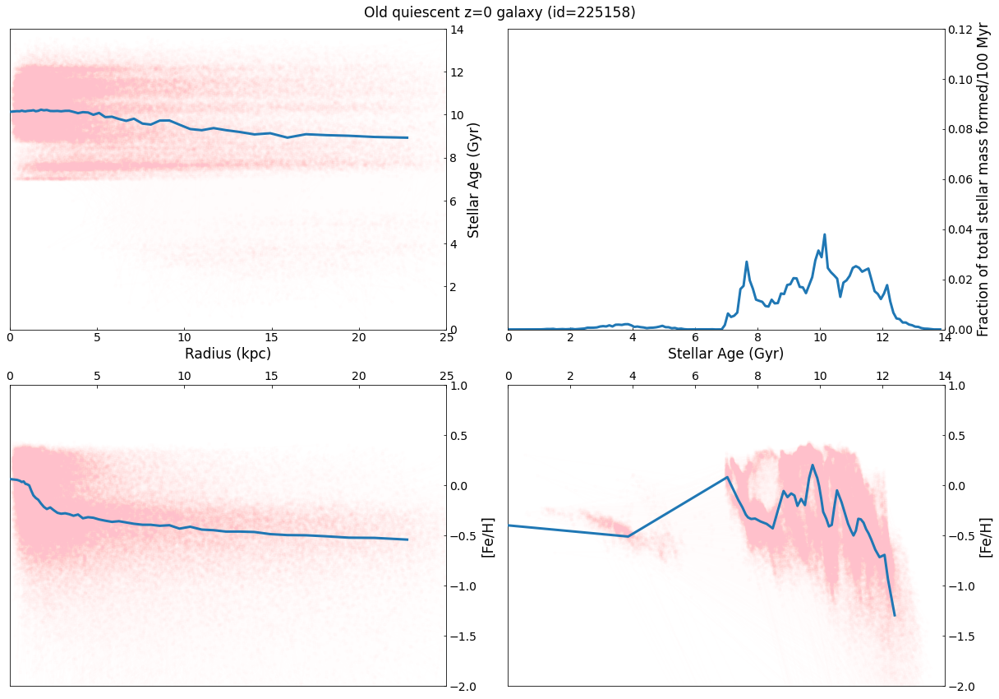

In [5]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(0, 25)
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(0, 25)
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

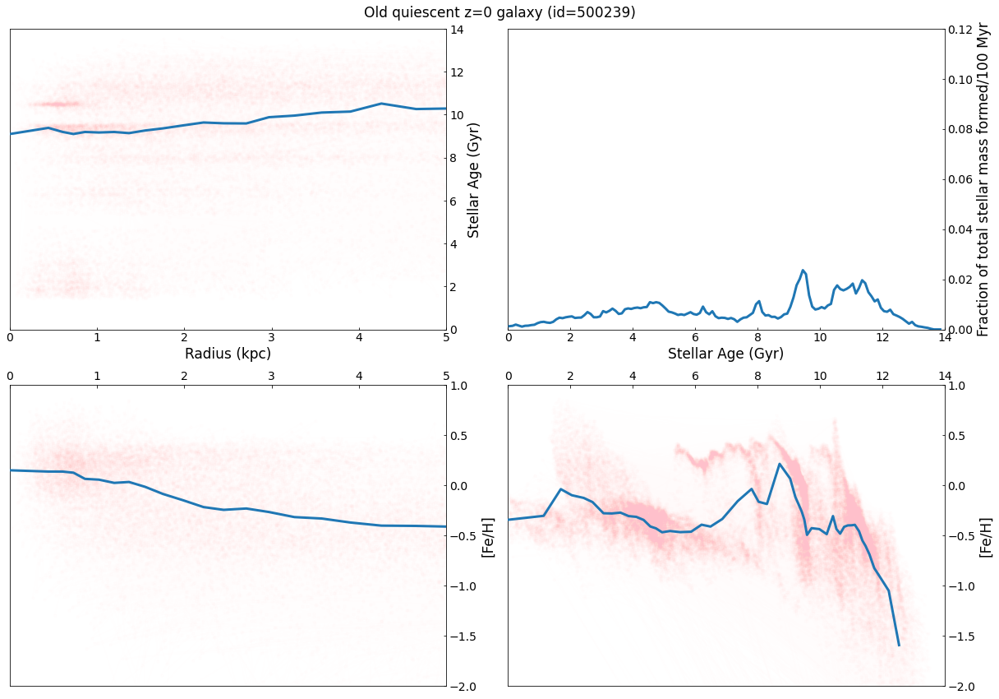

In [69]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(12)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

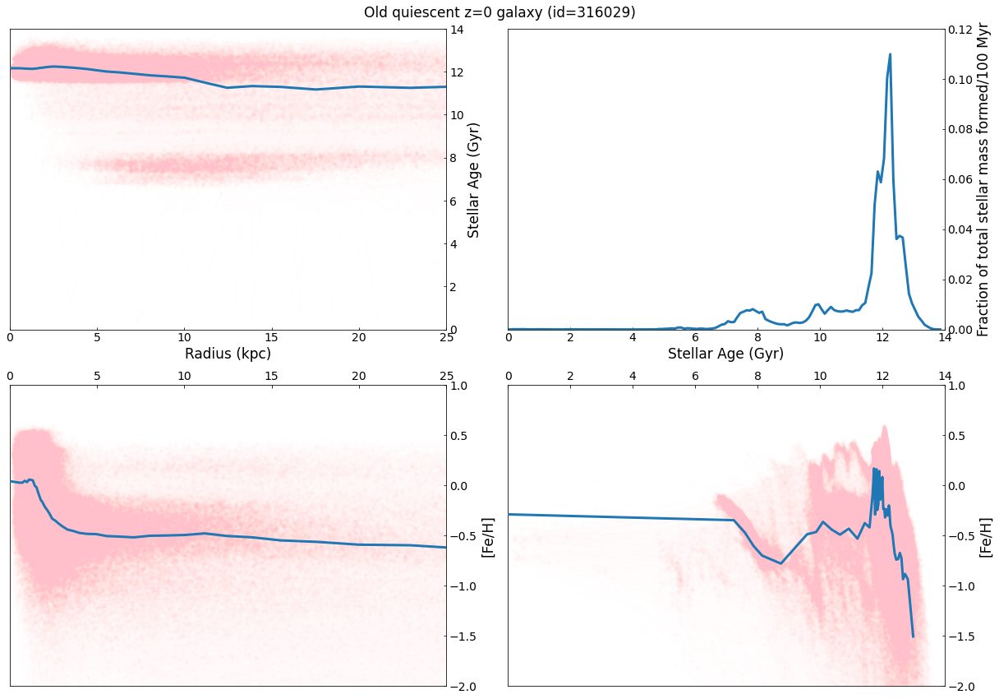

In [70]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(14)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(0, 25)
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(0, 25)
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

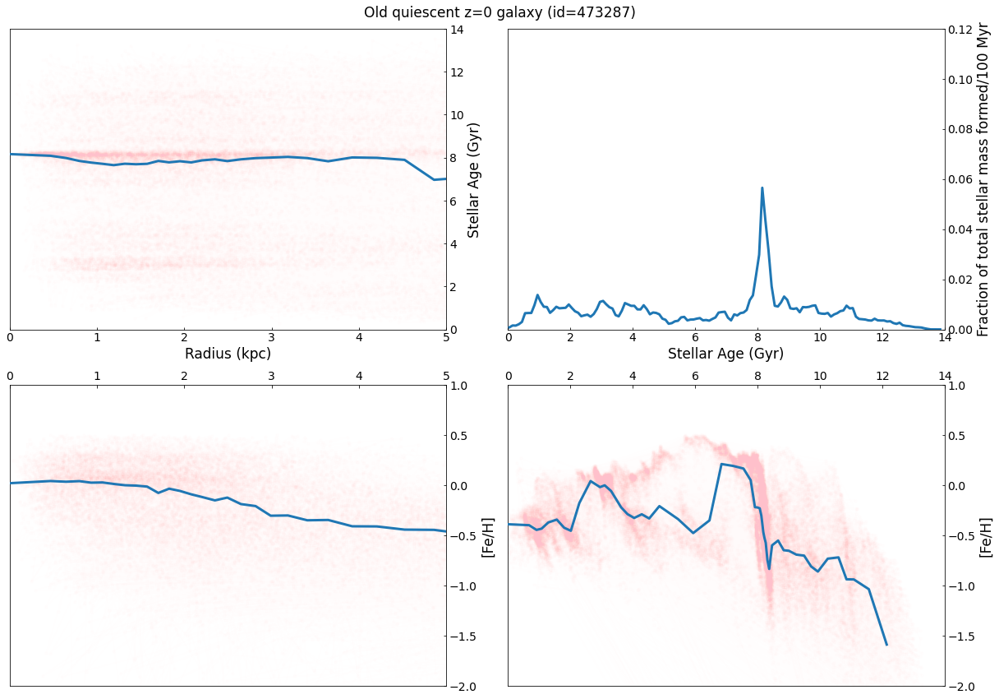

In [71]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(15)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

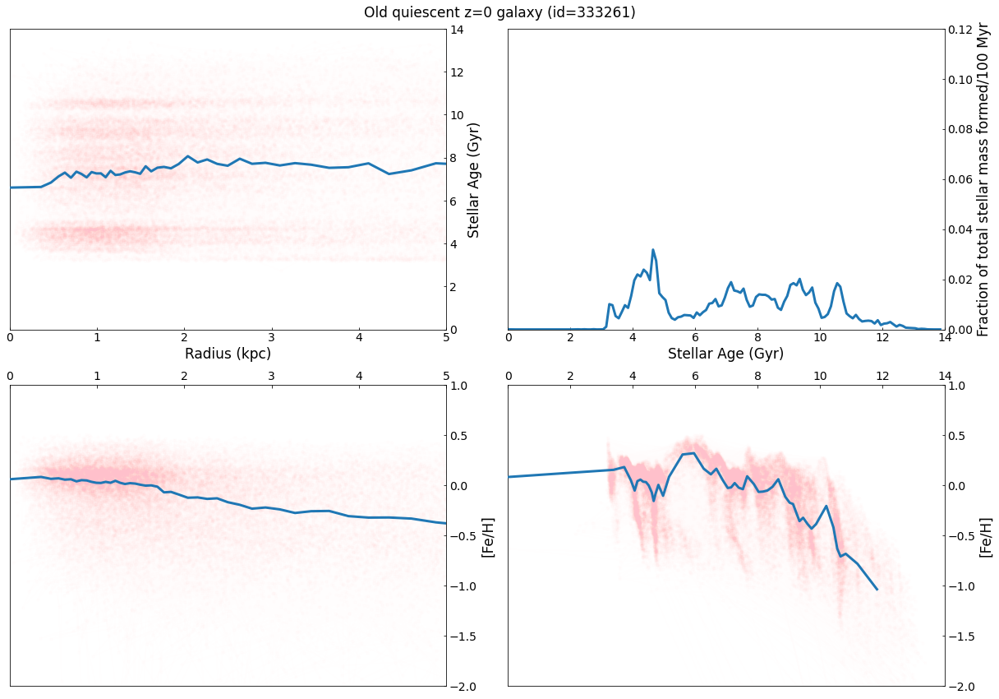

In [72]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(16)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Intermediate quiescent galaxiestimerange

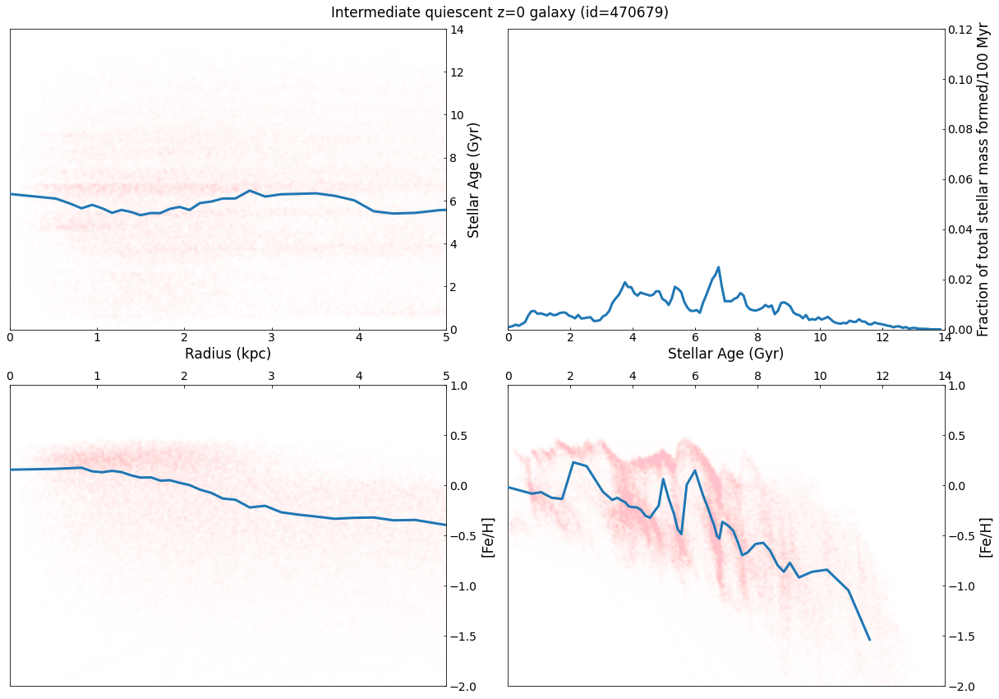

In [73]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

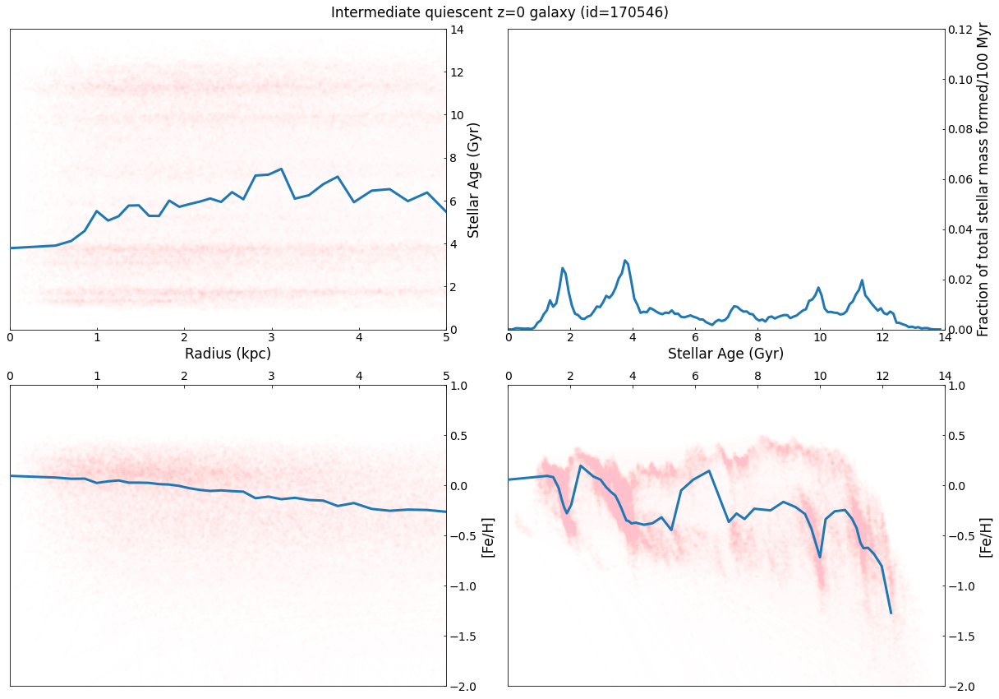

In [74]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(10)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

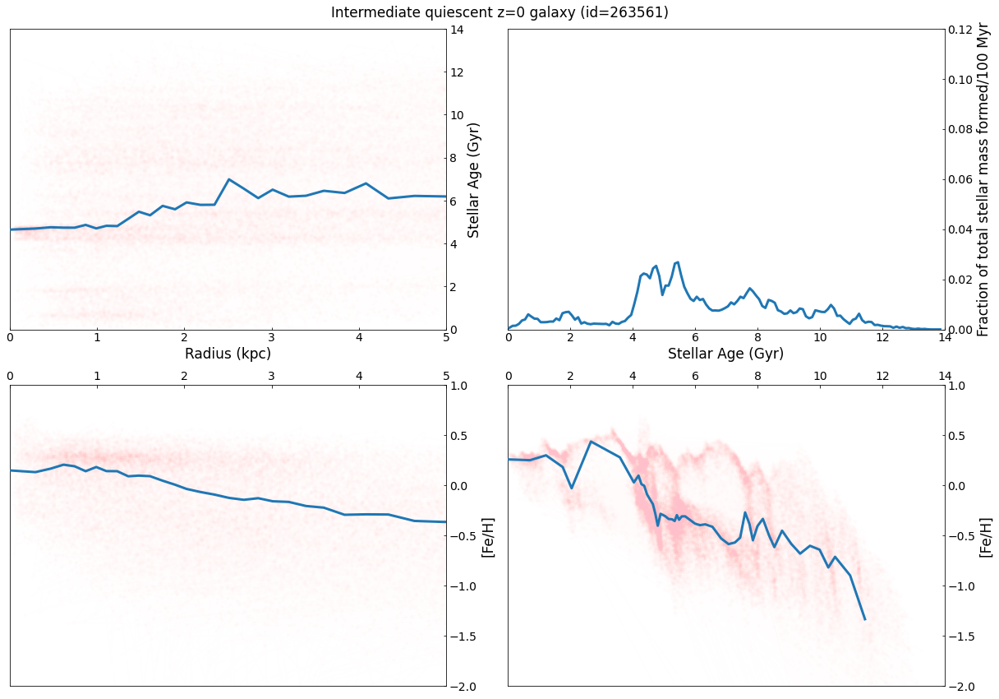

In [75]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(11)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

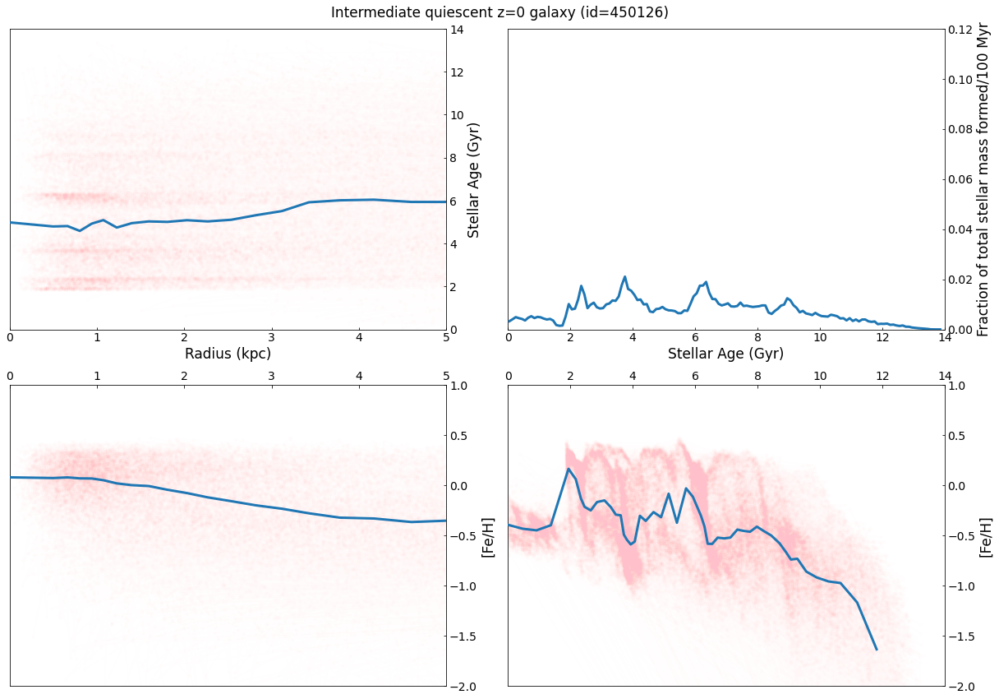

In [76]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(12)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

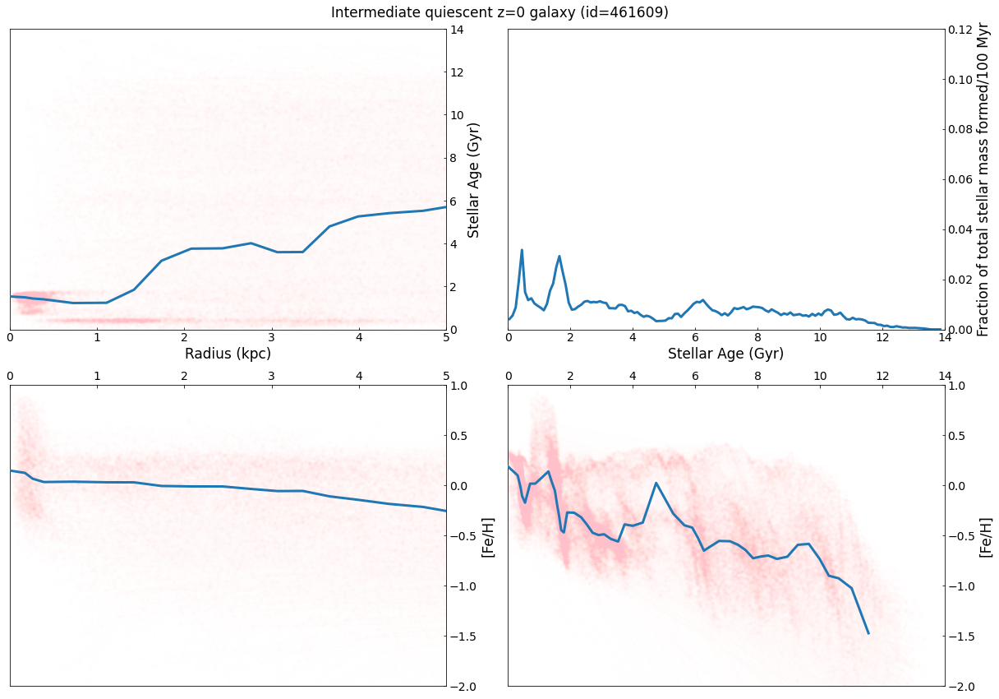

In [77]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(13)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Young quiescent galaxies

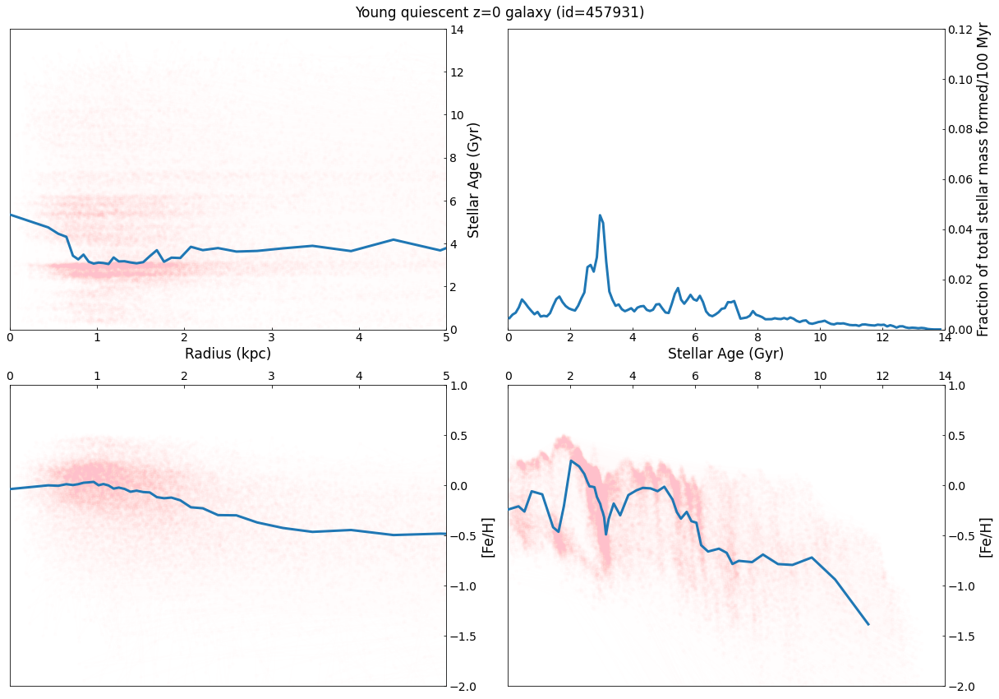

In [78]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

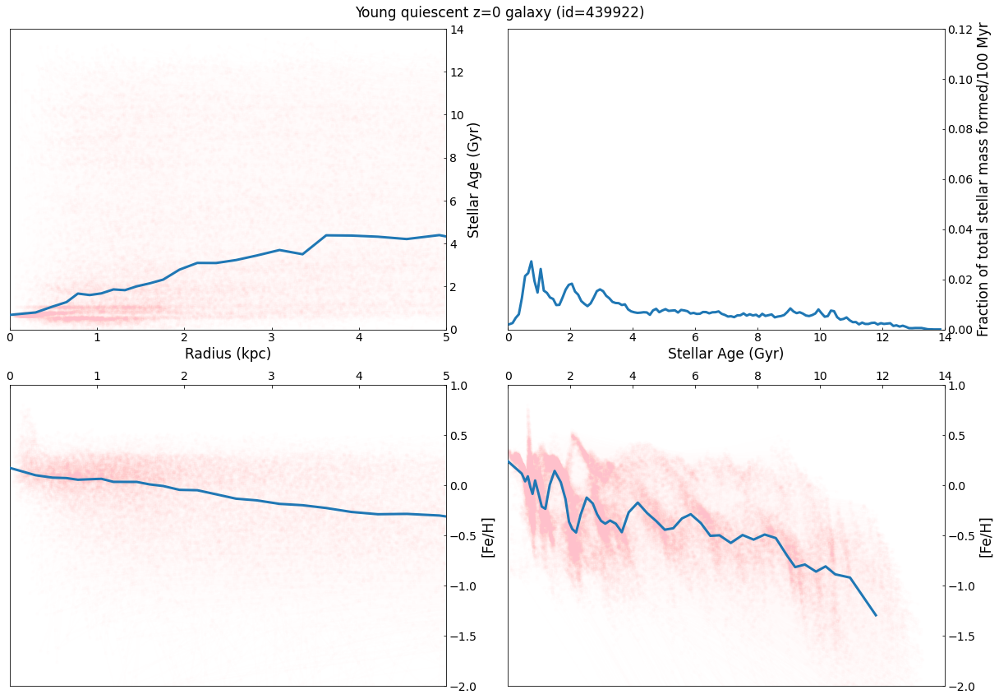

In [79]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(1)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

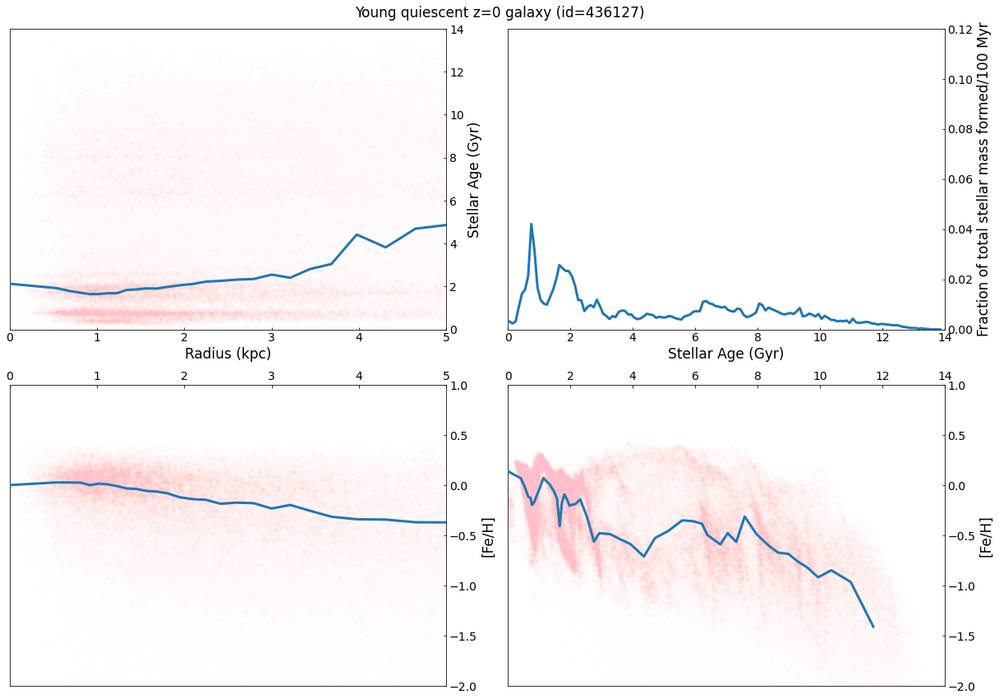

In [80]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(2)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

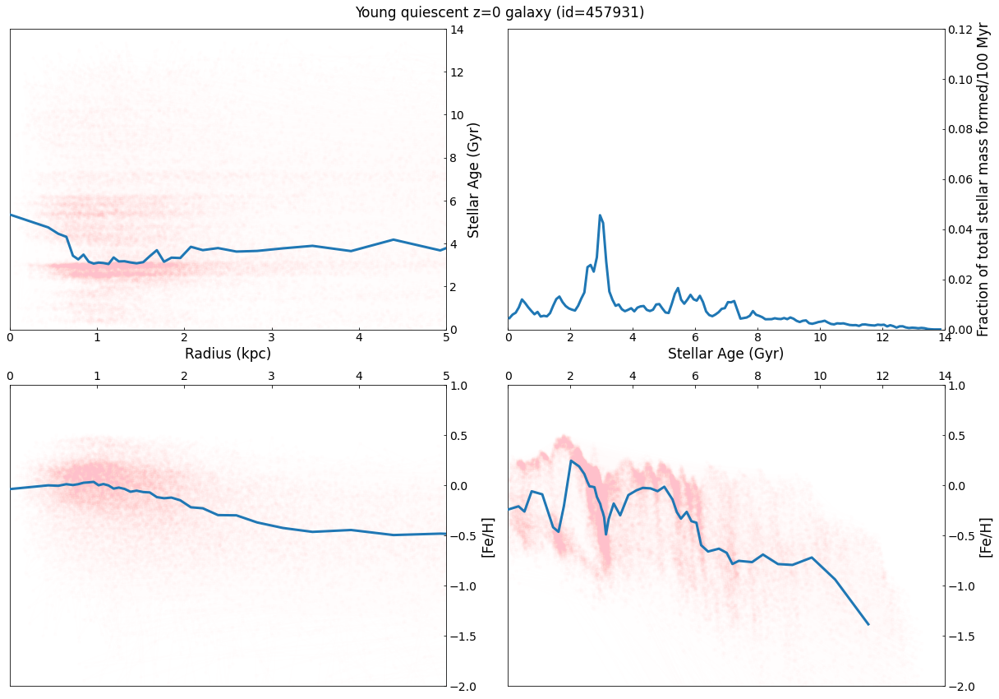

In [81]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(3)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

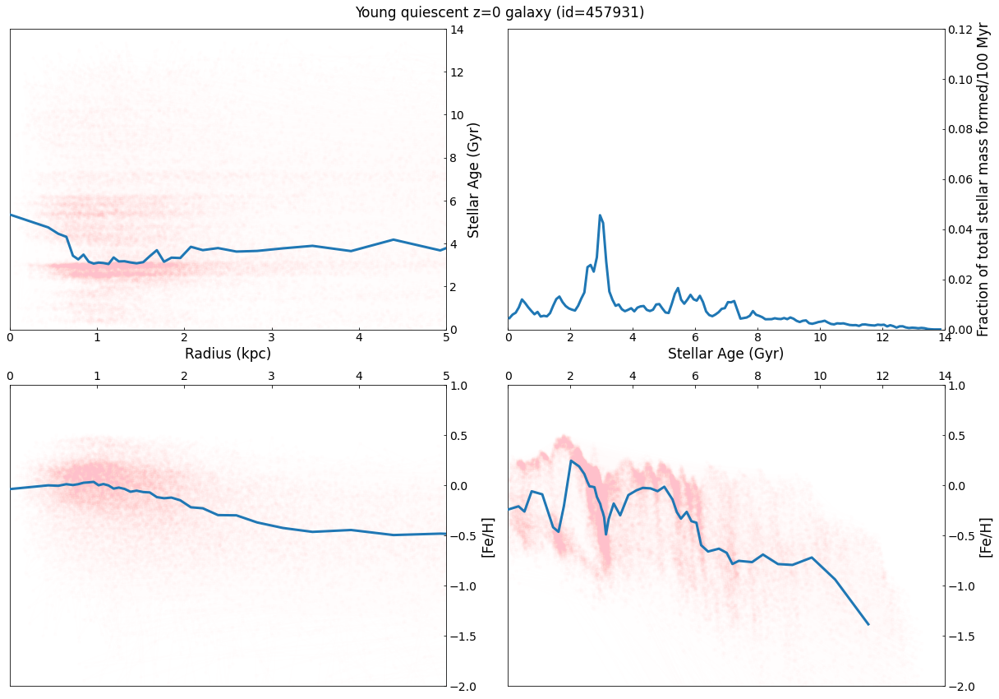

In [82]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(4)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Star-forming galaxies

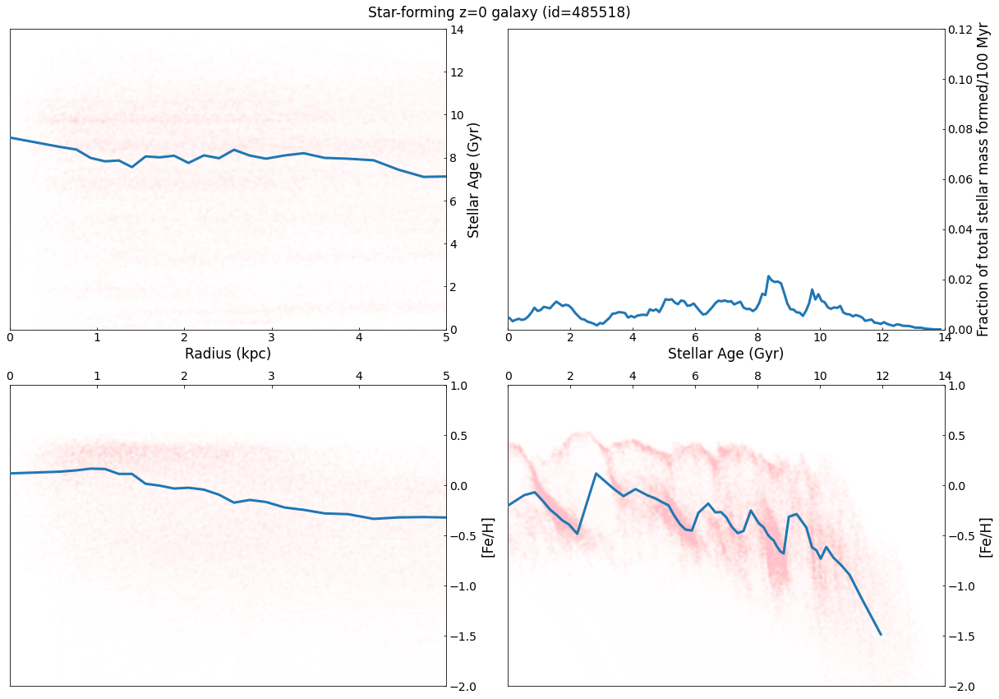

In [83]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

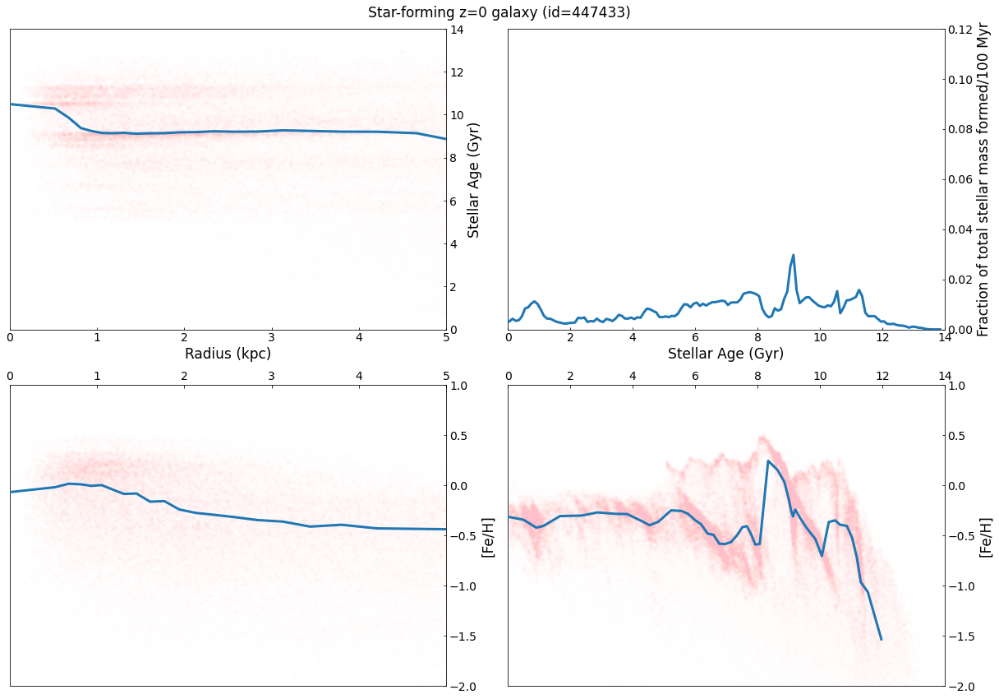

In [84]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(3)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

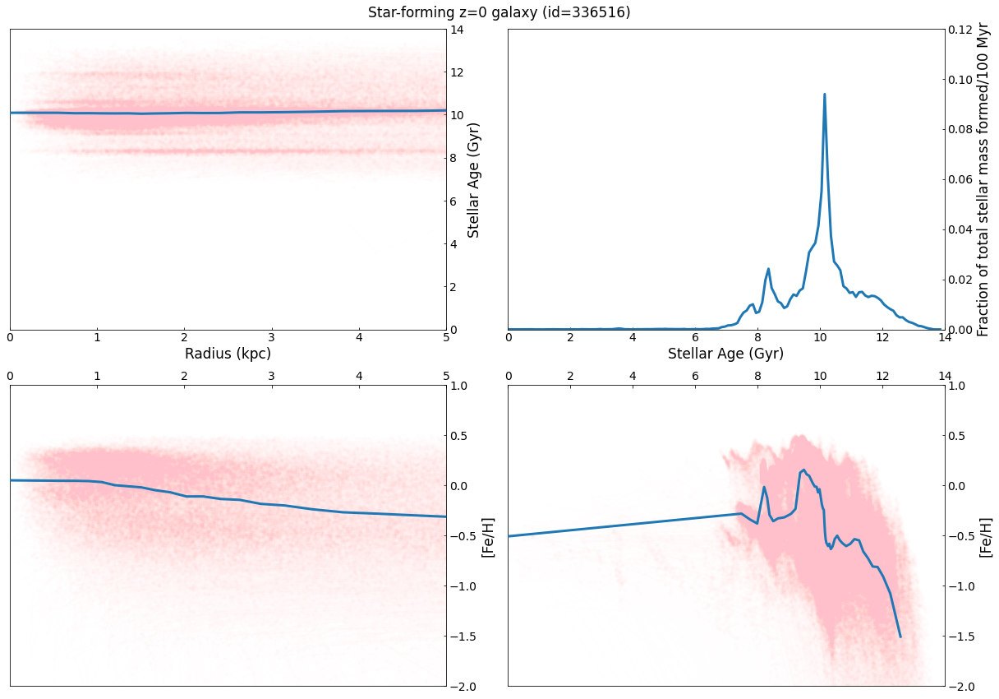

In [85]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(4)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

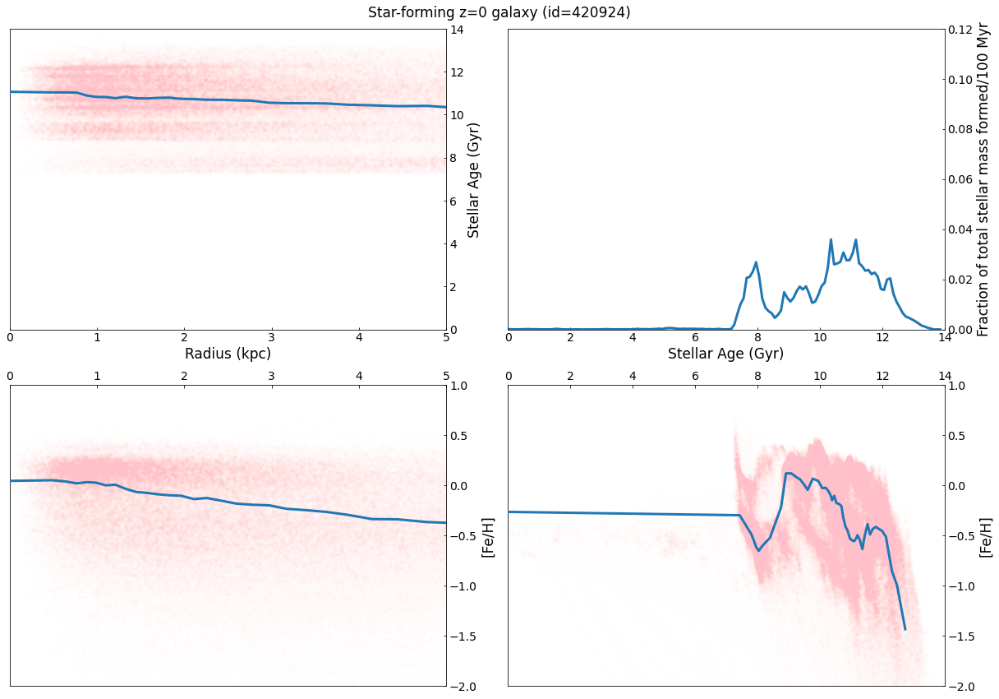

In [86]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(5)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

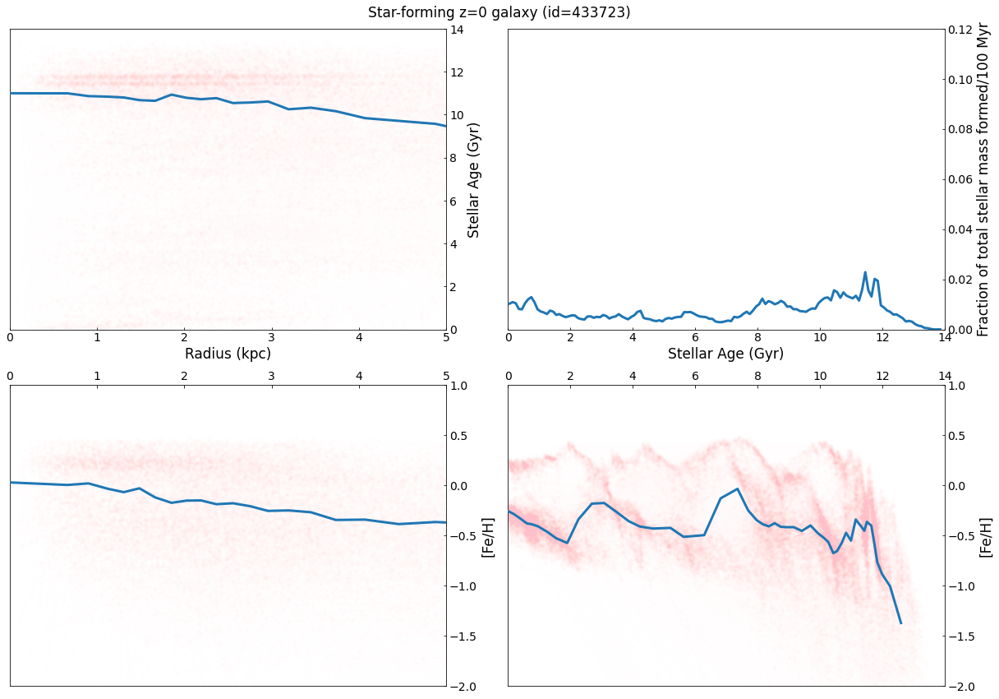

In [87]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12))
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(6)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logFeH, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='age')
yy2, logFeH, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logFeH, logFeH]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Fe/H]', '[Fe/H]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(FeH_lim[0], FeH_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

# [Mg/Fe]

## Old quiescent galaxies

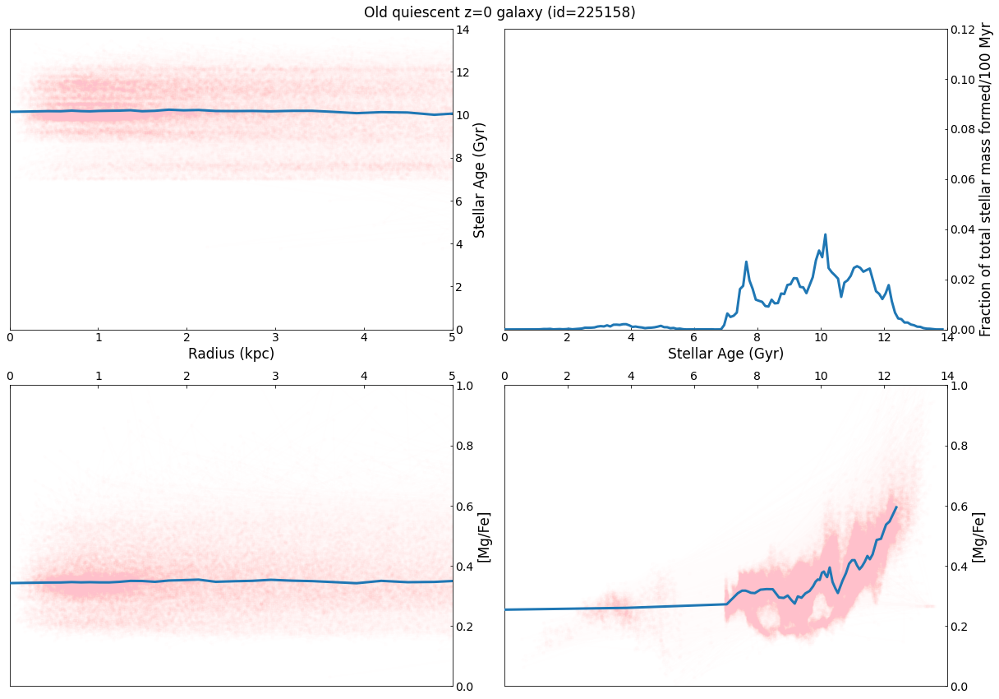

In [90]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

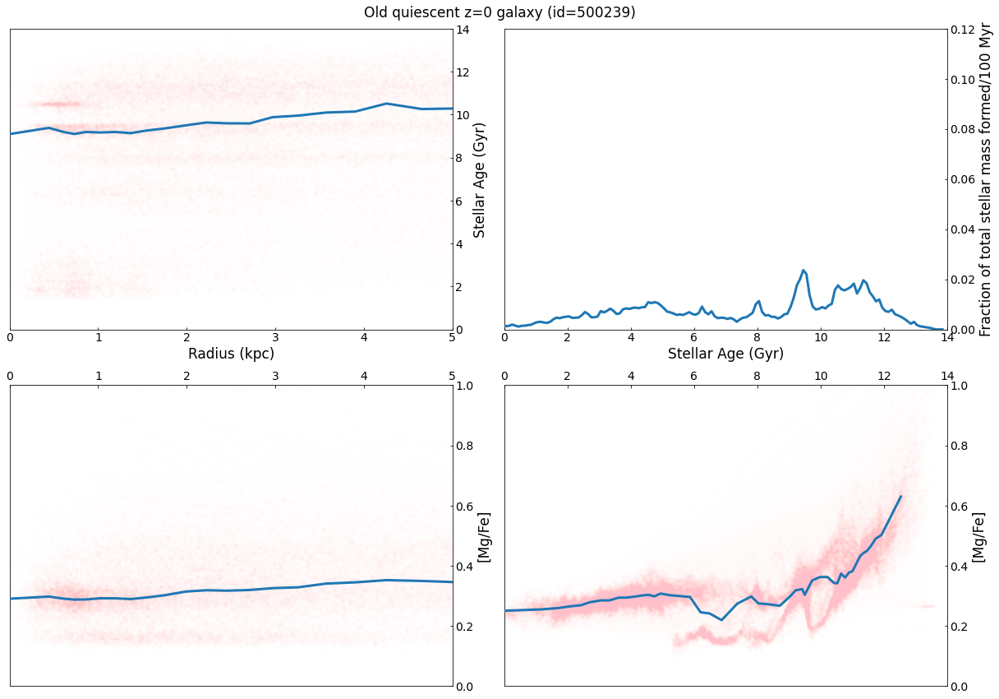

In [91]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(12)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

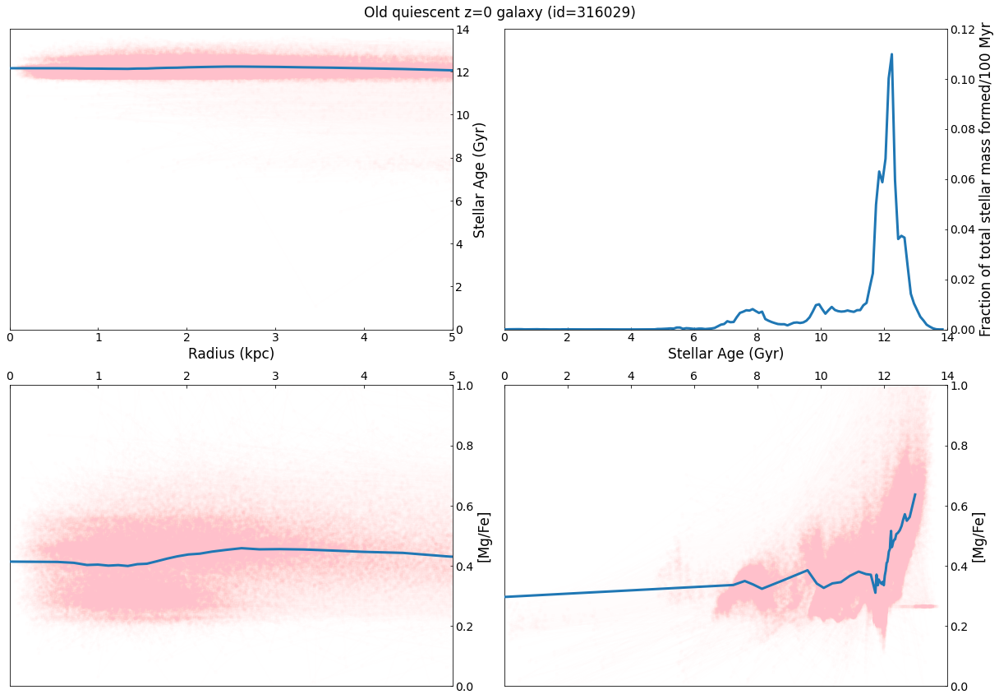

In [92]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(14)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

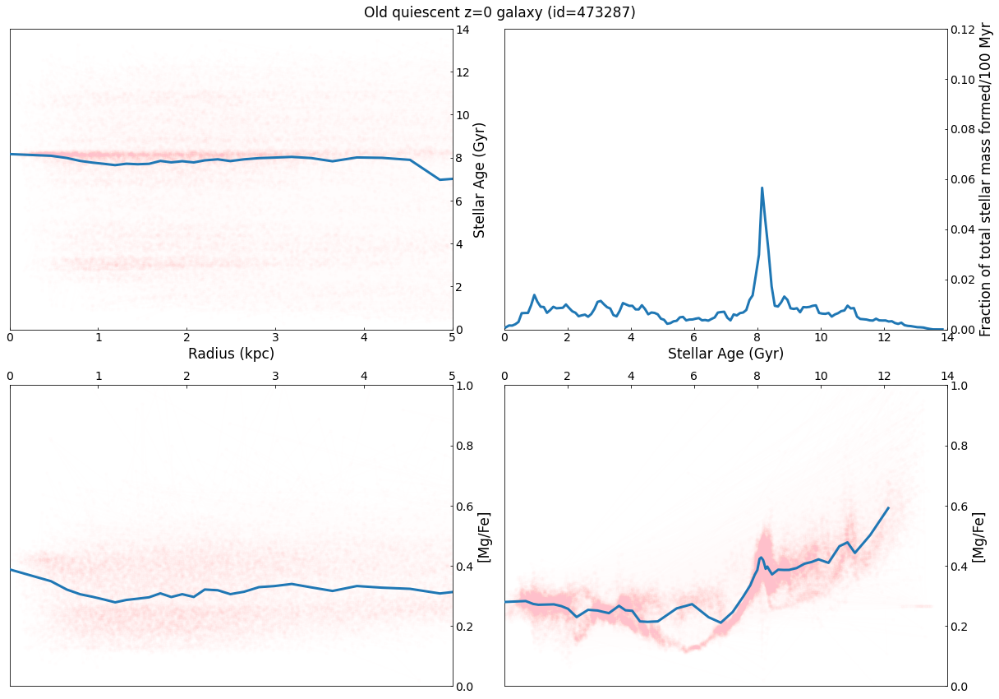

In [93]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(15)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

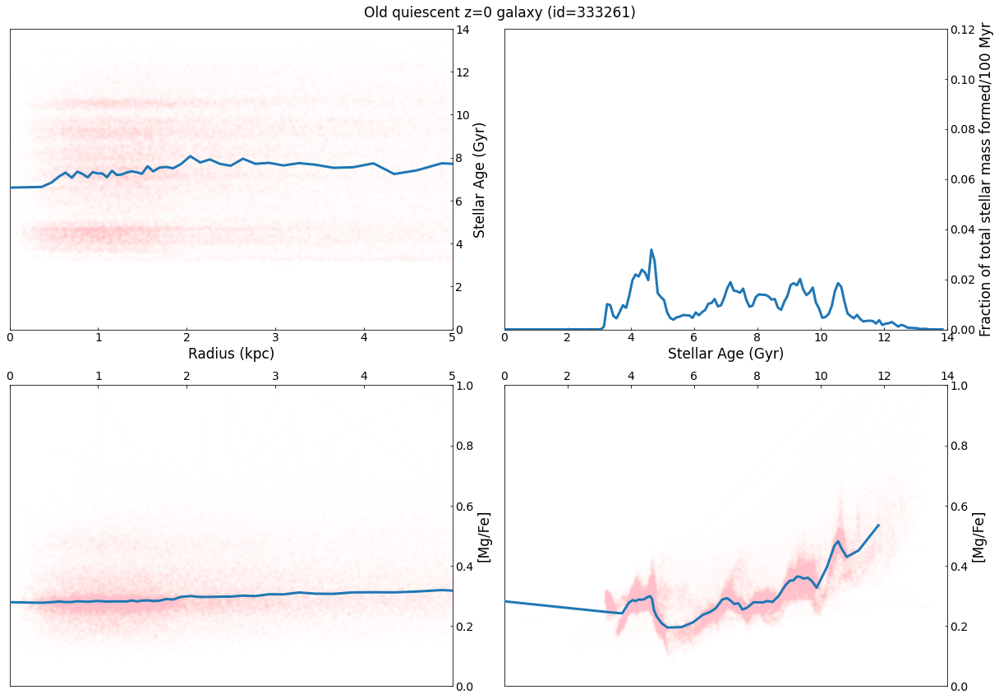

In [94]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(16)
id = np.random.choice(ids[old_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Old quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Intermediate quiescent galaxies

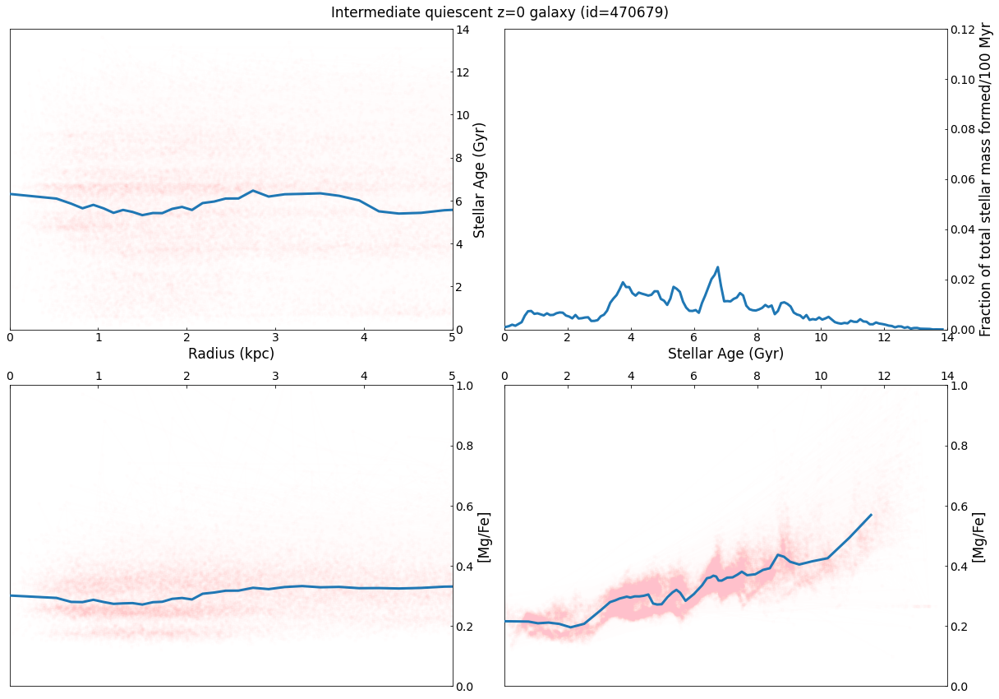

In [95]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

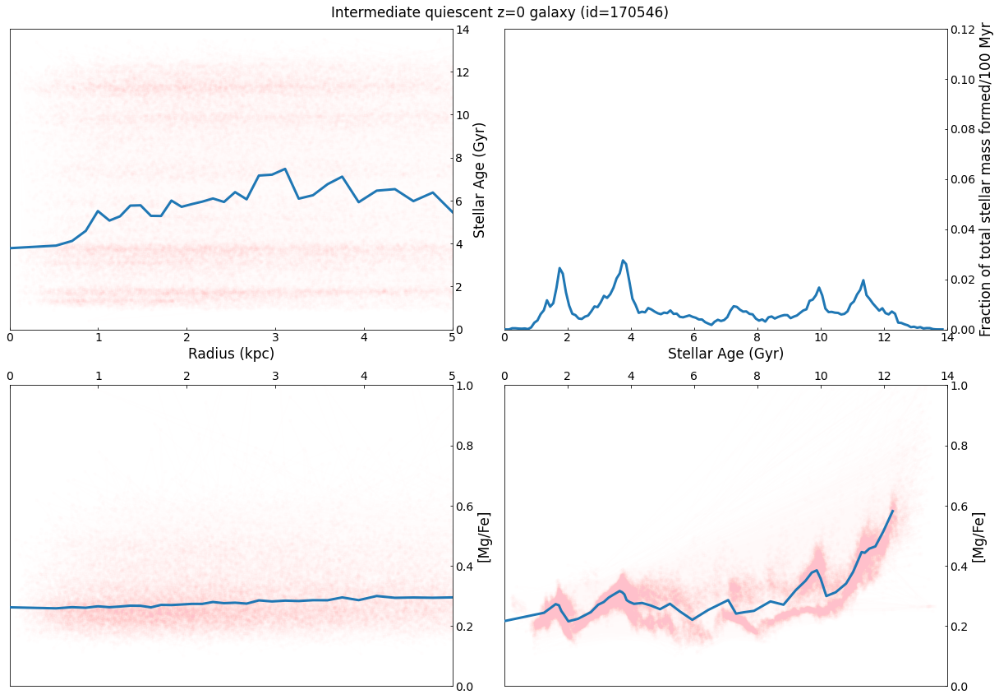

In [96]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(10)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

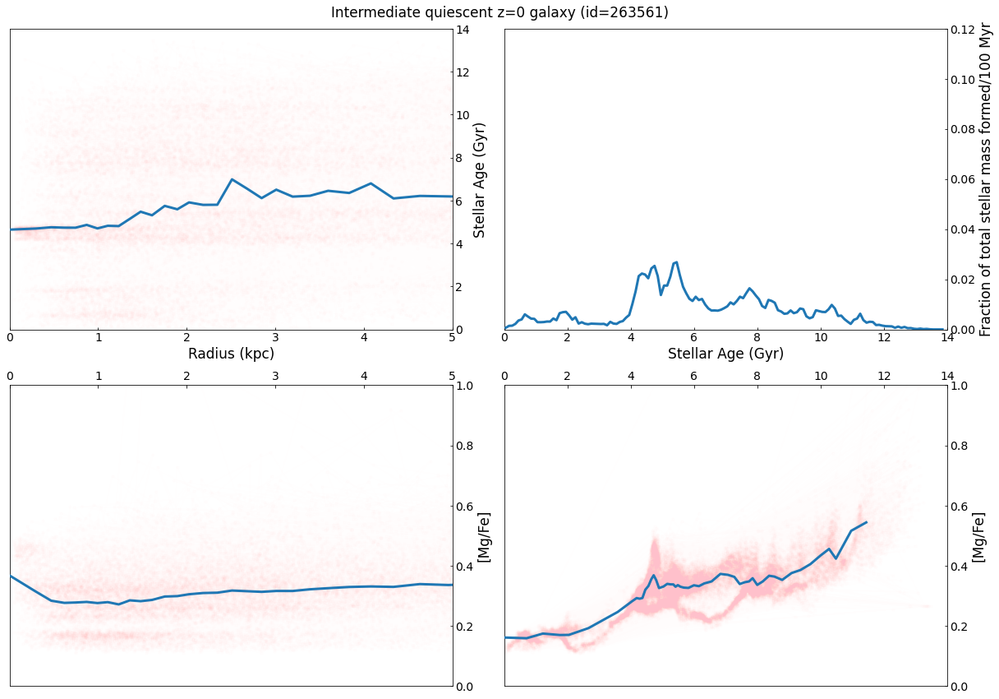

In [97]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(11)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

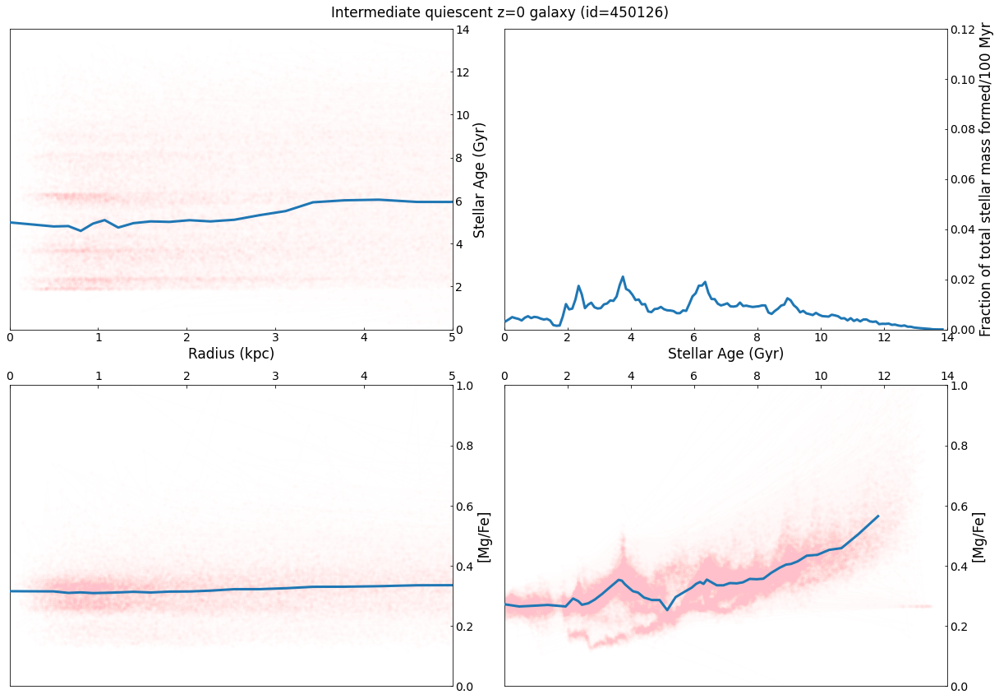

In [98]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(12)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

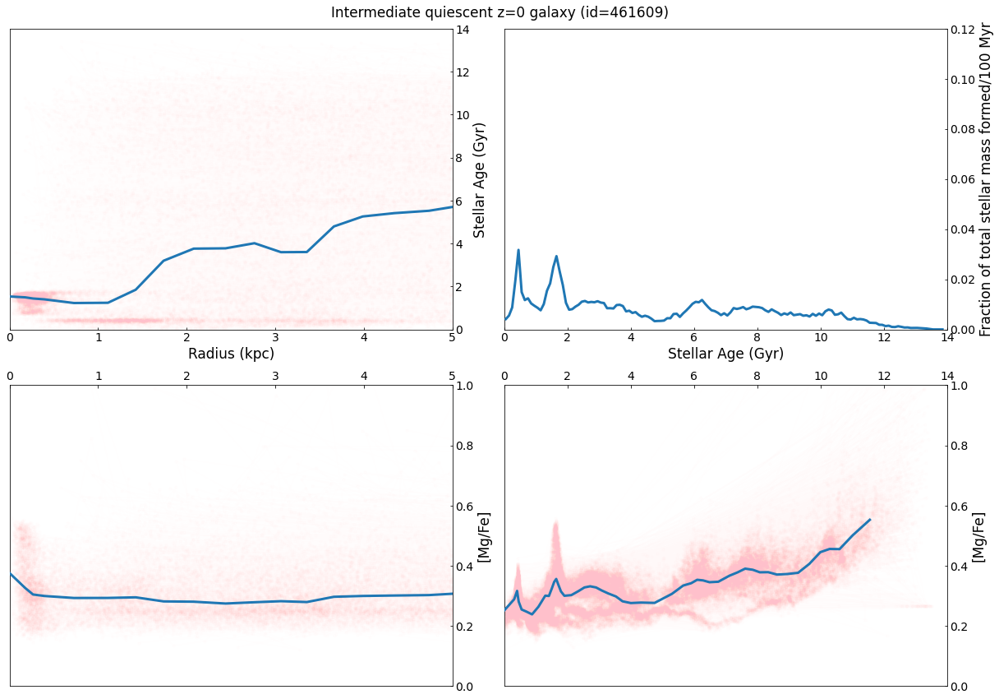

In [99]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(13)
id = np.random.choice(ids[intermediate_quiescent_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Intermediate quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Young quiescent galaxies

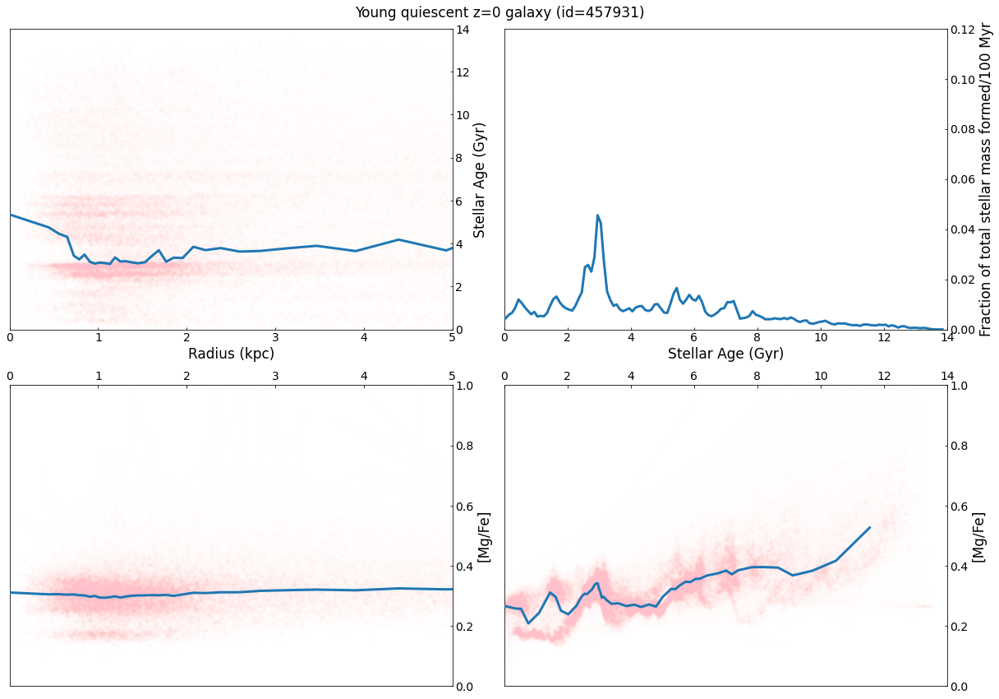

In [100]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

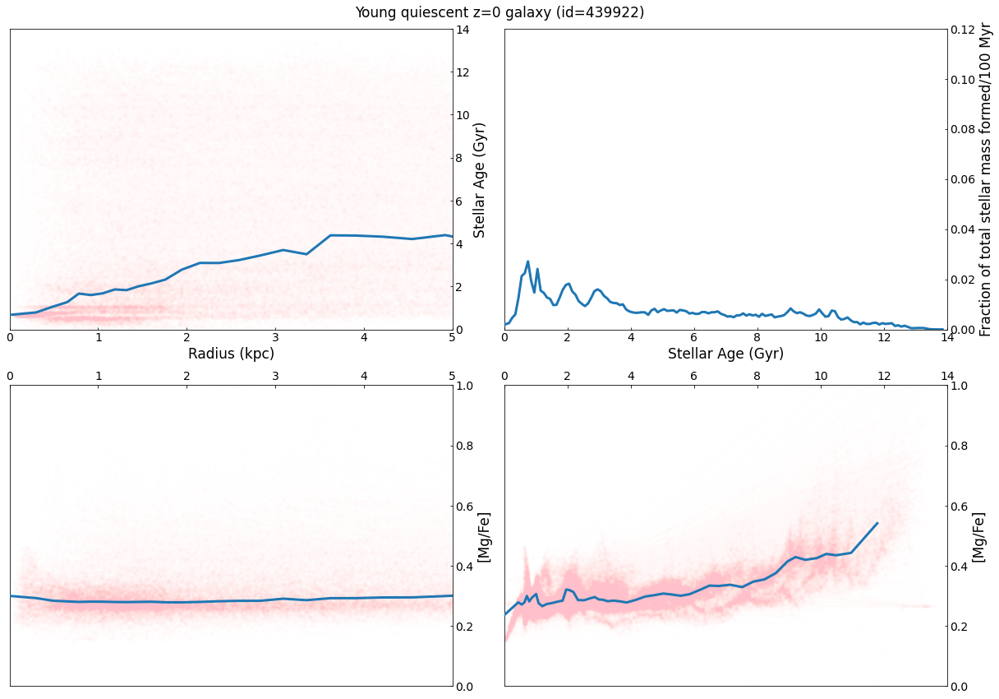

In [101]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(1)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

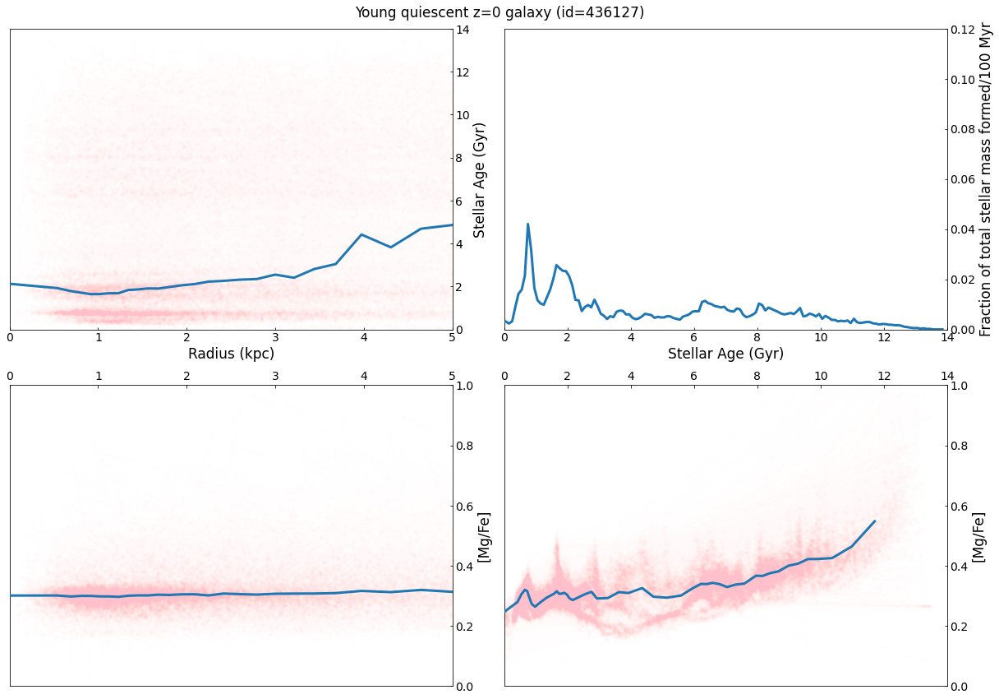

In [102]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(2)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

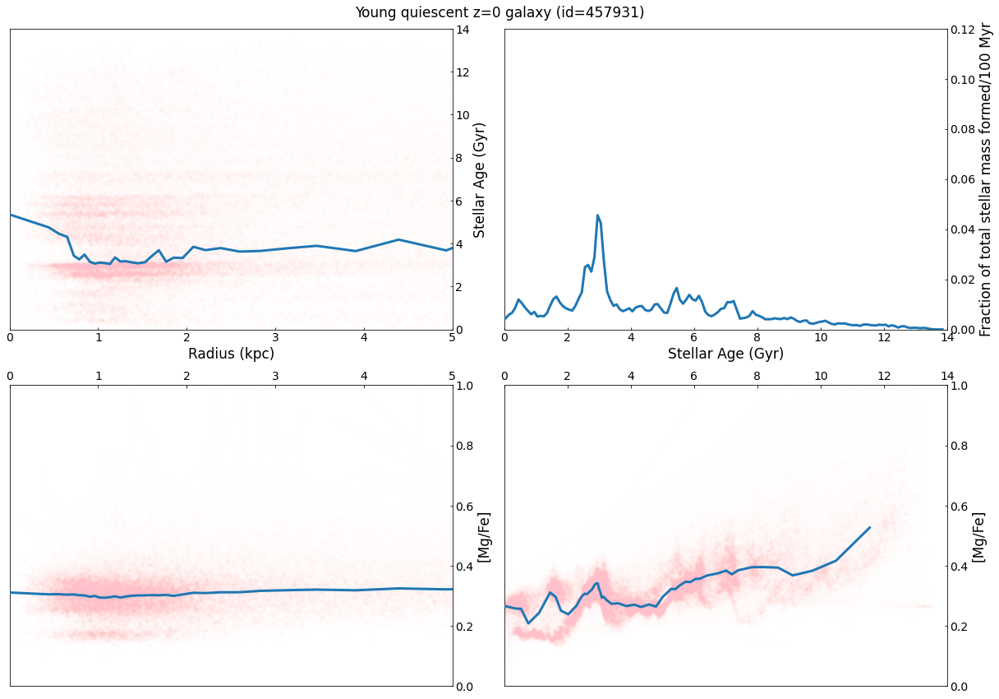

In [103]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(3)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

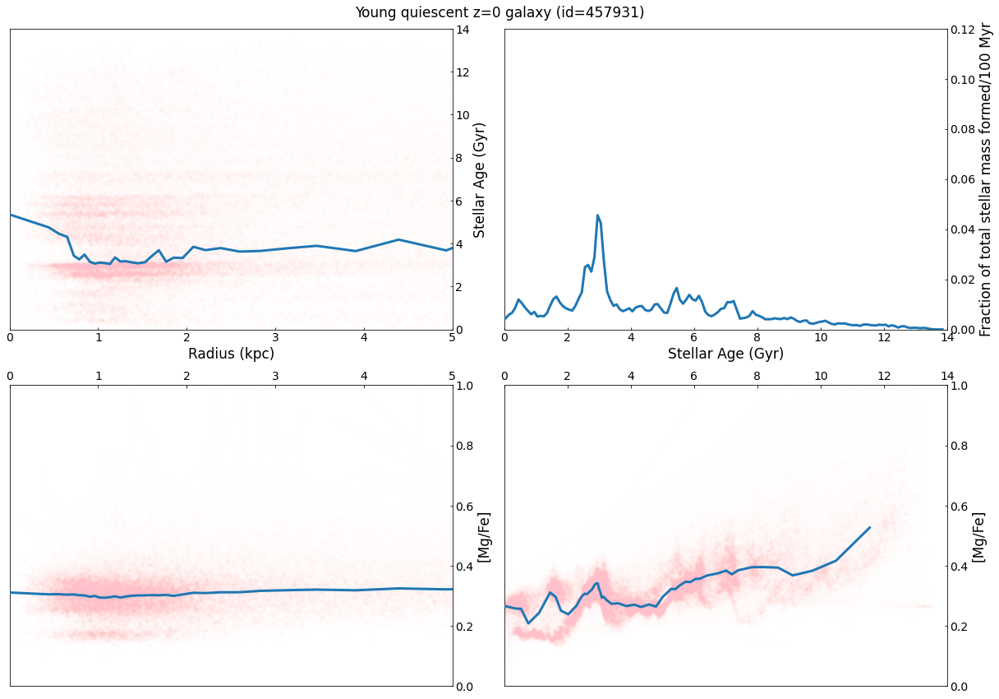

In [104]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(4)
id = np.random.choice(ids[PSB_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Young quiescent z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

## Star-forming galaxies

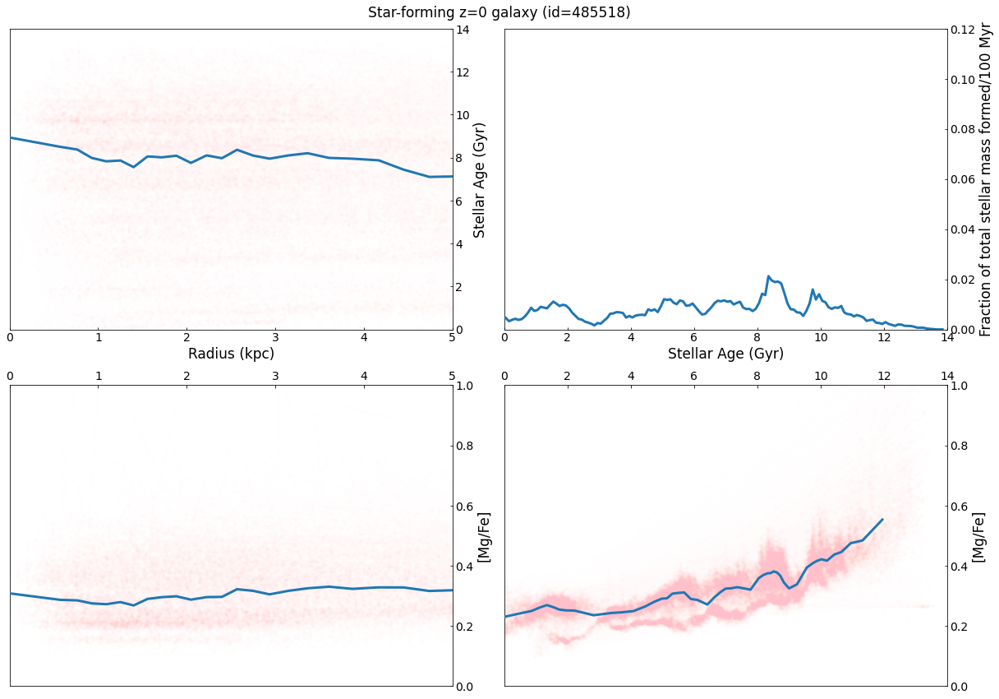

In [105]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(9)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

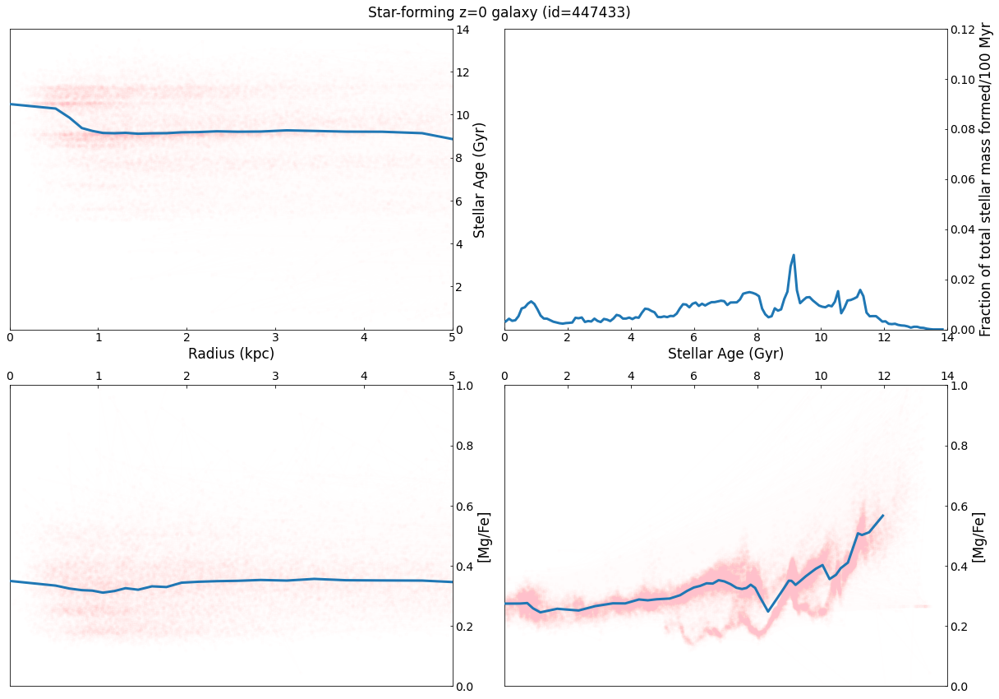

In [106]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(3)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

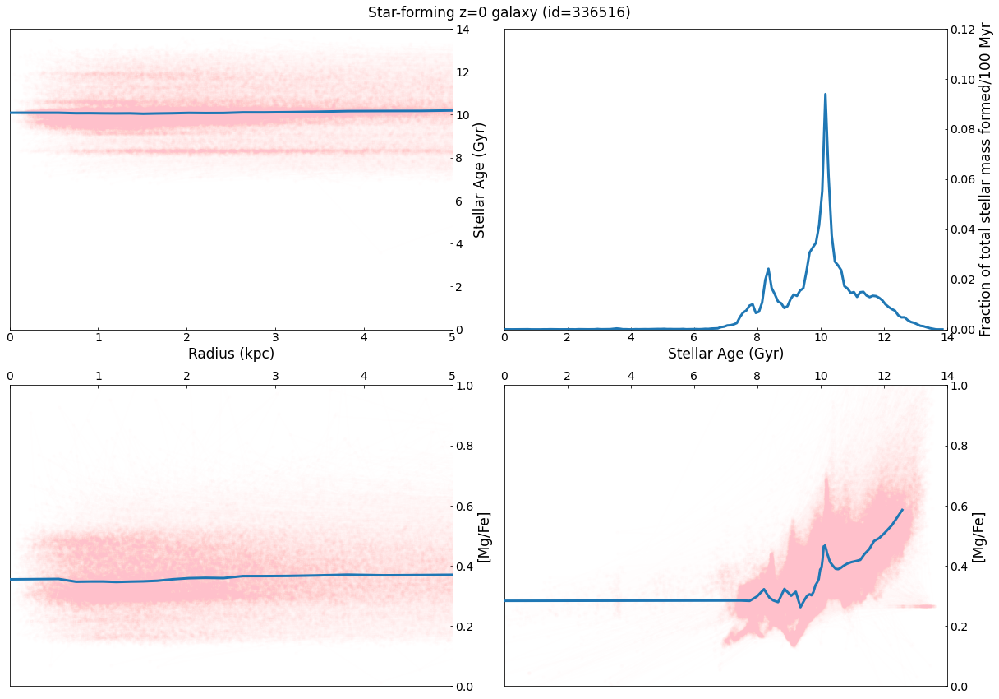

In [107]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(4)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

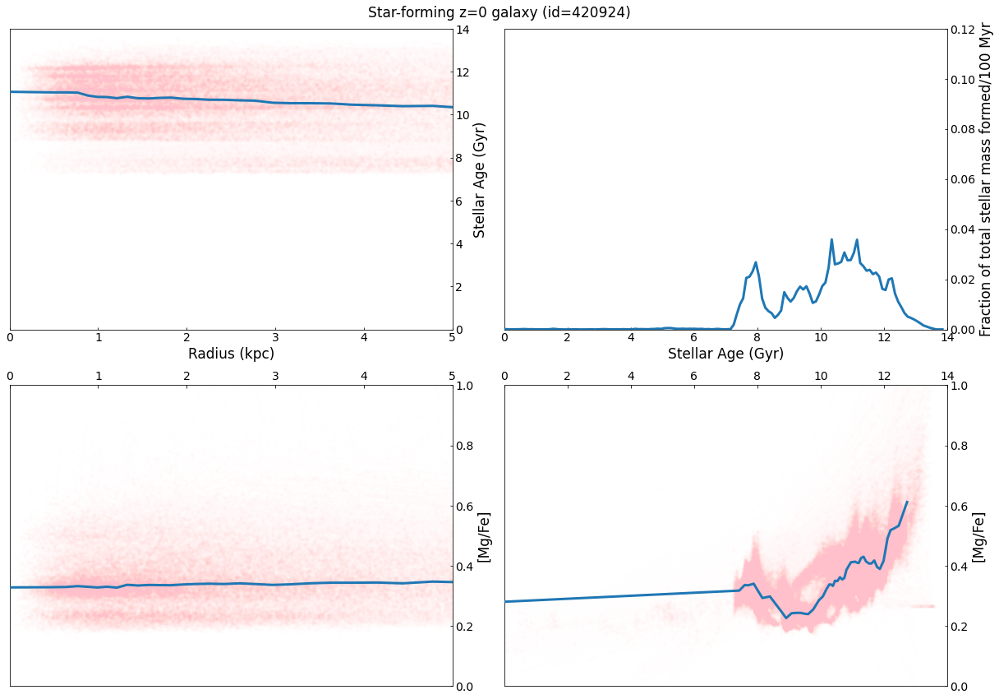

In [108]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(5)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)

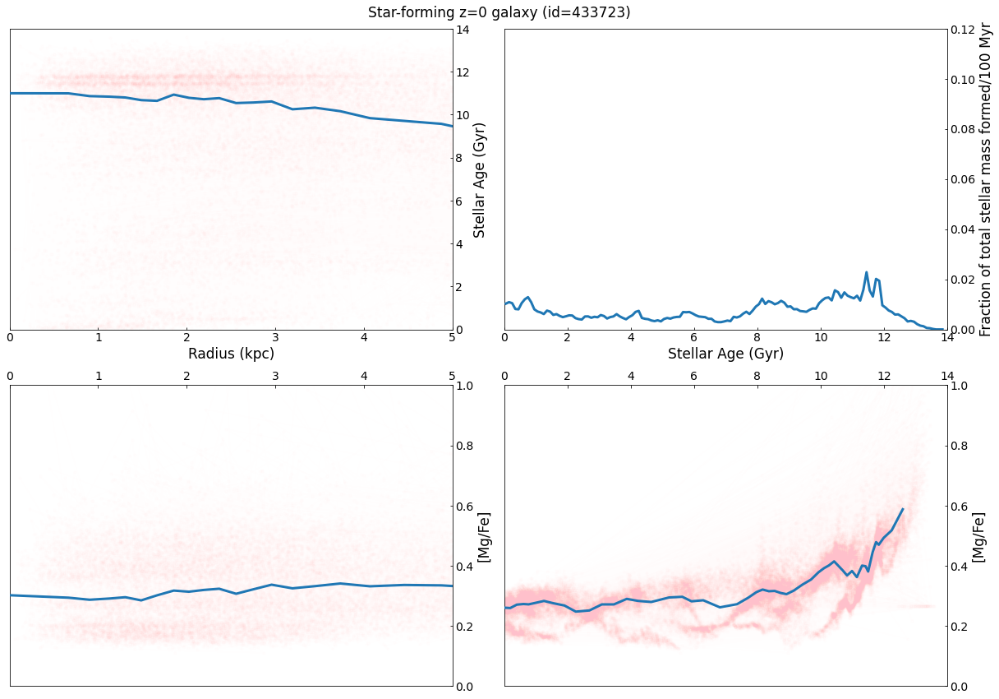

In [109]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000

fig = plt.figure(1,figsize=(17,12)) #change until looks square
fig.clf()
markersize = 4
fts = 17
fts_s = 14

n_bins = 50
binwidth = 0.1
np.random.seed(6)
id = np.random.choice(ids[starforming_selection])

gs0 = gridspec.GridSpec(2, 2)#,left=0.03, right=0.94,top=0.92,bottom=0.09,wspace=0.3,hspace=0.3)

gs = {}
yy0, xx0 = age_profile(id=id, redshift=redshift, n_bins=n_bins)
yy3, logratio, xx3, age = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='age')
yy2, logratio, xx2, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', axis='distance')
xx1, SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth, timerange=timerange)
yy1 = SFH/np.sum(SFH)

xx = [xx0, xx1, xx2, xx3]
yy = [yy0, yy1, yy2, yy3]
xxx = [R, 0, R, age]
yyy = [age, 0, logratio, logratio]
# xlim = [M_lim, logRe_lim, MRe_lim]
# ylim = [FeHRe_lim, MgFeRe_lim, MgHRe_lim]
xlabel = ['Radius (kpc)', 'Stellar Age (Gyr)', 'Radius (kpc)', 'Stellar Age (Gyr)']
ylabel = ['Stellar Age (Gyr)', 'Fraction of total stellar mass formed/100 Myr', '[Mg/Fe]', '[Mg/Fe]']
# title = ['Star-forming z='+str(redshift)+' galaxy ', 'Young quiescent z='+str(redshift)+' galaxy ', 
#          'Intermediate quiescent z='+str(redshift)+' galaxy ', 'Old quiescent z='+str(redshift)+' galaxy ']

for m in range(4):
    gs[m] = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[m])

for m in range(4):
    ax = plt.subplot(gs[m][0])
        
    ax.plot(xx[m], yy[m], linewidth=3, zorder=4)
    ax.plot(xxx[m], yyy[m], 'pink', marker='.', alpha=0.01)
    
    if m == 0:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(age_lim[0], age_lim[1])
    elif m == 1:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.xaxis.set_label_position('bottom')
        ax.yaxis.set_label_position('right')
        ax.xaxis.tick_bottom()
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(sfr_lim[0], sfr_lim[1])
    elif m ==2:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=True, bottom=False, left=False, right=True)
        ax.yaxis.set_label_position('right')
        ax.yaxis.tick_right()
        ax.set_ylabel(ylabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.set_xlim(r_lim[0], r_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
    else:
        ax.tick_params(labelsize=fts_s, direction='in', which='both', top=False, bottom=True, left=False, right=True)
        ax.set_ylabel(ylabel[m], fontsize=fts)
        #ax.set_xlabel(xlabel[m], fontsize=fts)
        ax.xaxis.tick_top()
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position('right')
        ax.set_xlim(age_lim[0], age_lim[1])
        ax.set_ylim(MgFe_lim[0], MgFe_lim[1])
        
fig.suptitle('Star-forming z='+str(redshift)+' galaxy (id='+str(id)+')', fontsize=fts)
fig.tight_layout()

#plt.savefig('FIGURES\individual.png', dpi=400)